In [1]:

# Import Required Modules
from flask import Flask, render_template
import pandas as pd
import json
import plotly
import plotly.express as px
import pandas_ta as pta
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from datetime import date
from datetime import datetime
from datetime import timedelta, date
from prophet import Prophet
import pandas as pd
import numpy as np
import yfinance as yf
import seaborn as sns
import mpld3
import matplotlib.pyplot as plt
import warnings


# Create Home Page Route
app = Flask(__name__)


   
df = pd.read_csv("Resources/btcjoin.csv", parse_dates=['date'])
btc_df = yf.Ticker('BTC-USD').history(period='7y',interval='1d',actions=False).reset_index()
btc_df = btc_df.loc[(btc_df['Date'] > '2022-10-25')]
btc_df['Close']=btc_df['Close'].astype("float")
df['price']=df['price'].str.replace(',','')
df['price']=df['price'].astype("float")
btc_df = btc_df.rename(columns={"Close": "price", "Date":"date"})
btc_df['date'] = btc_df['date'].apply(lambda x: x.strftime('%Y-%m-%d'))
btc_df['date'] = pd.to_datetime(btc_df['date'])

df = pd.merge(df, btc_df, on=['date', 'price'], how='outer')
df = pd.merge(df, btc_df, on=['date', 'price'], how='outer')
df = df.rename(columns={"value": "wallets"})
df = df.drop(columns=['volume','change', 'low', 'high', 'open','Unnamed: 0', "wallets", "address", "mined"])
df['200D'] = df['price'].rolling(200).mean()
df['300D'] = df['price'].rolling(300).mean()
df['50D'] = df['price'].rolling(50).mean()
df['7D'] = df['price'].rolling(7).mean()
# df = df.dropna()
df['meanavge'] = (df['200D'] + df['300D'] + df['50D'] )/3
# df = df.drop(columns=['200D','300D', '50D'])
df['meanvalue'] = df["price"] - df["meanavge"]
df['status'] = df['meanvalue'].apply(lambda x: '1' if x > 0 else '0')
df['status']=df['status'].astype("object")
df['price-meanavge']=df['price'] - df['meanavge']
df['move%'] = (df['price-meanavge']/(df['price'] + df['meanavge']))
bins = [-.43, -.18, 0, .18, .43]
group_names = ["Severely Oversold","Neutral Oversold", "Neutral Overbought","Severely Overbought"]
df["Valuation"] = pd.cut(df["move%"], bins, labels=group_names)

k = df['price'].ewm(span=12, adjust=False, min_periods=12).mean()

# Get the 12-day EMA of the closing price
d = df['price'].ewm(span=26, adjust=False, min_periods=26).mean()

# Subtract the 26-day EMA from the 12-Day EMA to get the MACD
macd = k - d

# Get the 9-Day EMA of the MACD for the Trigger line
macd_s = macd.ewm(span=9, adjust=False, min_periods=9).mean()

# Calculate the difference between the MACD - Trigger for the Convergence/Divergence value
macd_h = macd - macd_s

# Add all of our new values for the MACD to the dataframe
df['macd'] = df.index.map(macd)
df['macd_h'] = df.index.map(macd_h)
df['macd_s'] = df.index.map(macd_s)


df['priceL'] = np.log(df['price'])

df_train = df[['date', 'priceL']]
df_train = df_train.rename(columns = {"date":"ds", "priceL":"y"})

# instantiate the model and set parameters
model = Prophet()

# fit the model to historical data
model.fit(df_train);

start = "2010-09-25"
end = date.today() + timedelta(days=60)
insample = pd.DataFrame(pd.date_range(start,end, periods=92))

# Change the column name
insample.columns = ['ds']

# in-sample prediction
prediction = model.predict(insample)


# Before calling the function or method that triggers the warning:
with warnings.catch_warnings():
    # Ignore FutureWarning raised within this block
    warnings.simplefilter("ignore", FutureWarning)

# Buy Zones
    fig = px.scatter(df, x="date", y="price", color="Valuation", color_discrete_sequence=["red","green","blue","orange"],
                    title="price")
    fig.add_trace(go.Scatter(name="MeanAvg", x=df['date'], y=df['meanavge'], marker = {'color' : 'black'}, legendrank=2))
    fig.add_trace(go.Scatter(x=prediction['ds'], y=np.exp(prediction['yhat']),
        fill=None,
        mode='lines',
        line_color='lightblue',
        ))
    fig.add_trace(go.Scatter(
        x=prediction['ds'],
        y=np.exp(prediction['yhat_lower']),
        fill='tonexty', # fill area between trace0 and trace1
        mode='lines', line_color='lightblue'))

    fig.add_trace(go.Scatter(
        x=prediction['ds'],
        y=np.exp(prediction['yhat_upper']),
        fill='tonexty', # fill area between trace0 and trace1
        mode='lines', line_color='lightblue'))

fig.update_yaxes(fixedrange=False)
fig.update_layout(title_text='Bitcoin Prophet Model + Buy Zones')
fig.update_yaxes(type="log")
fig.update_xaxes(ticklabelposition="inside top", title="Date")
fig.update_yaxes(nticks=12)
fig.update_xaxes(nticks=50)
fig.update_layout(
    margin=dict(l=20, r=100, t=70, b=20),
)
fig.update_layout(height=500, width=1000)
fig.update_layout(showlegend=False)
fig.add_vline(x='2012-11-28', line_width=3, line_dash="dash", line_color="green")
fig.add_vline(x='2016-07-09', line_width=3, line_dash="dash", line_color="green")	
fig.add_vline(x='2020-05-11', line_width=3, line_dash="dash", line_color="green")	
fig.add_vline(x='2024-04-02', line_width=3, line_dash="dash", line_color="green")
fig.update_layout(template='plotly_white')
fig.show()

c:\Users\chris\anaconda3\envs\python_data\Lib\site-packages\yfinance\utils.py:775: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
09:28:06 - cmdstanpy - INFO - Chain [1] start processing
09:28:10 - cmdstanpy - INFO - Chain [1] done processing


In [38]:
# Buy Zones
fig = px.scatter(df, x="date", y="price", color="Valuation", color_discrete_sequence=["red","green","blue","orange"],
                title="price")
fig.add_trace(go.Scatter(name="MeanAvg", x=df['date'], y=df['meanavge'], marker = {'color' : 'black'}, legendrank=2))
fig.add_trace(go.Scatter(x=prediction['ds'], y=np.exp(prediction['yhat']),
    fill=None,
    mode='lines',
    line_color='lightblue',
    ))
fig.add_trace(go.Scatter(
    x=prediction['ds'],
    y=np.exp(prediction['yhat_lower']),
    fill='tonexty', # fill area between trace0 and trace1
    mode='lines', line_color='lightblue'))

fig.add_trace(go.Scatter(
    x=prediction['ds'],
    y=np.exp(prediction['yhat_upper']),
    fill='tonexty', # fill area between trace0 and trace1
    mode='lines', line_color='lightblue'))

fig.update_yaxes(fixedrange=False)
fig.update_layout(title_text='Bitcoin Prophet Model + Buy Zones')
fig.update_yaxes(type="log")
fig.update_xaxes(ticklabelposition="inside top", title="Date")
fig.update_yaxes(nticks=12)
fig.update_xaxes(nticks=50)
fig.update_layout(
    margin=dict(l=20, r=100, t=70, b=20),
)
fig.update_layout(height=500, width=1000)
fig.update_layout(showlegend=False)
fig.add_vline(x='2012-11-28', line_width=3, line_dash="dash", line_color="green")
fig.add_vline(x='2016-07-09', line_width=3, line_dash="dash", line_color="green")	
fig.add_vline(x='2020-05-11', line_width=3, line_dash="dash", line_color="green")	
fig.add_vline(x='2024-04-02', line_width=3, line_dash="dash", line_color="green")
fig.update_layout(template='plotly_white')

# Define colors
colors = ["red", "orange", "blue", "green"]

# Create figure
fig.add_trace(go.Indicator(
    mode="number+gauge+delta",
    value=df['move%'].iloc[-1],
    delta={'reference': 0},
    title={'text': df['Valuation'].iloc[-1]},
    domain={'x': [0.5, .9], 'y': [0.1, 0.18]},
    gauge={
        'shape': "bullet",
        'axis': {'range': [min(bins), max(bins)]},
        'bar': {'color': 'black'},
        'steps': [{'range': [bins[i], bins[i + 1]], 'color': colors[i]} for i in range(len(bins) - 1)]
    }
))


fig.show()

In [2]:
import pandas_ta as pta
df['RSI'] = pta.rsi(df['price'], length = 14)

fig = make_subplots(rows=2, cols=1,shared_xaxes=True,vertical_spacing=0.00001, row_heights=[0.2,0.2])

fig.add_trace(
    go.Scatter(name="Price",x=df['date'], y=df['price'],
        marker=dict(color=df['macd'], coloraxis="coloraxis1")),
    row=1, col=1)


fig.add_trace(
    go.Scatter(name="RSI",x=df['date'], y=df['RSI'],
    marker=dict(color=df['RSI'], coloraxis="coloraxis3")),
    row=2, col=1)



fig.update_yaxes(nticks=10)
fig.update_xaxes(nticks=50)
fig.update_yaxes(type="log", row=1, col=1)
fig.update_layout(coloraxis1=dict(colorscale='Bluered_r'), showlegend=True)
fig.update_layout(coloraxis2=dict(colorscale='Bluered_r'), showlegend=True)
fig.update_layout(coloraxis3=dict(colorscale='Bluered_r'), showlegend=True)
fig.update_layout(coloraxis1_showscale=False)
fig.update_layout(coloraxis2_showscale=False)
fig.update_layout(height=700, width=1000, title_text="720 Day MACD, RSI, Price and Move%")
fig.update_layout(template='plotly_dark')
fig.show()


In [3]:
## Moving averages

fig = px.scatter(df, x="date", y="price", color="Valuation", color_discrete_sequence=["red","green","blue","orange"],
                title="price")
fig.add_trace(go.Scatter(name="200D", x=df['date'], y=df['200D'], marker = {'color' : 'red'}, legendrank=2))
fig.add_trace(go.Scatter(name="MeanAverage", x=df['date'], y=df['meanavge'], marker = {'color' : 'purple'}, legendrank=2))
fig.add_trace(go.Scatter(name="50D", x=df['date'], y=df['50D'], marker = {'color' : 'blue'}, legendrank=2))
fig.add_trace(go.Scatter(name="300D", x=df['date'], y=df['300D'], marker = {'color' : 'white'}, legendrank=2))

# Moving Averages
fig.update_yaxes(fixedrange=False)
fig.update_layout(title_text='Moving Averages')
fig.update_yaxes(type="log")
fig.update_xaxes(ticklabelposition="inside top", title="Date")
fig.update_yaxes(nticks=12)
fig.update_xaxes(nticks=50)
fig.update_layout(margin=dict(l=20, r=100, t=70, b=20))
fig.update_layout(height=500, width=1000)
fig.update_layout(showlegend=True)
fig.add_vline(x='2012-11-28', line_width=3, line_dash="dash", line_color="green")
fig.add_vline(x='2016-07-09', line_width=3, line_dash="dash", line_color="green")	
fig.add_vline(x='2020-05-11', line_width=3, line_dash="dash", line_color="green")	
fig.add_vline(x='2024-04-02', line_width=3, line_dash="dash", line_color="green")
fig.update_layout(template='plotly_white')

In [4]:
import plotly.express as px
import plotly.graph_objects as go

# Assume df is your DataFrame and it contains 'date', 'price', 'Valuation', '200D', 'meanavge', '50D', and '300D'.

fig = px.scatter(df, x="date", y="price", color="Valuation", color_discrete_sequence=["red","green","blue","orange"], 
                 title="price")

# Add moving average lines
fig.add_trace(go.Scatter(name="200D", x=df['date'], y=df['200D'], marker={'color': 'red'}, legendrank=2))
# fig.add_trace(go.Scatter(name="MeanAverage", x=df['date'], y=df['meanavge'], marker={'color': 'purple'}, legendrank=2))
fig.add_trace(go.Scatter(name="50D", x=df['date'], y=df['50D'], marker={'color': 'blue'}, legendrank=2))
# fig.add_trace(go.Scatter(name="300D", x=df['date'], y=df['300D'], marker={'color': 'white'}, legendrank=2))

# Adding the clouds
upper_bound = df['200D'] * 1.3  # 1% above the 200-day MA
lower_bound = df['50D'] * 0.7   # 1% below the 50-day MA

fig.add_trace(go.Scatter(x=df['date'], y=upper_bound, line=dict(width=0), showlegend=False))
fig.add_trace(go.Scatter(x=df['date'], y=lower_bound, line=dict(width=0), fill='tonexty', 
                         fillcolor='rgba(245, 166, 35, 0.3)', showlegend=False))  # Orange cloud

# Note: Adjust the upper_bound and lower_bound calculations according to your needs.
# The rgba color format includes an alpha value (transparency) where 1 is opaque and 0 is fully transparent.

# Further styling as per your current setup...
fig.update_yaxes(fixedrange=False)
fig.update_layout(title_text='Moving Averages Cloud')
fig.update_yaxes(type="log")
fig.update_xaxes(ticklabelposition="inside top", title="Date")
fig.update_yaxes(nticks=12)
fig.update_xaxes(nticks=50)
fig.update_layout(margin=dict(l=20, r=100, t=70, b=20))
fig.update_layout(height=500, width=1000)
fig.update_layout(showlegend=True)
# Vertical lines
fig.add_vline(x='2012-11-28', line_width=3, line_dash="dash", line_color="green")
fig.add_vline(x='2016-07-09', line_width=3, line_dash="dash", line_color="green")    
fig.add_vline(x='2020-05-11', line_width=3, line_dash="dash", line_color="green")    
fig.add_vline(x='2024-04-02', line_width=3, line_dash="dash", line_color="green")
fig.update_layout(template='plotly_white')

# Display the figure
fig.show()


In [5]:
bins2 = [0, 25, 50, 75, 100]
group_names2 = ["Severely Oversold","Neutral Oversold", "Neutral Overbought","Severely Overbought"]
df["ValuationRSI"] = pd.cut(df["RSI"], bins2, labels=group_names2)

# Before calling the function or method that triggers the warning:
with warnings.catch_warnings():
    # Ignore FutureWarning raised within this block
    warnings.simplefilter("ignore", FutureWarning)

    fig = px.scatter(df, x="date", y="price", color="ValuationRSI", color_discrete_sequence=["red","green","blue","orange"],
                    title="price")
    fig.add_trace(go.Scatter(name="MeanAvg", x=df['date'], y=df['meanavge'], marker = {'color' : 'black'}, legendrank=2))
    fig.add_trace(go.Scatter(x=prediction['ds'], y=np.exp(prediction['yhat']),
        fill=None,
        mode='lines',
        line_color='lightblue', name='Prophet Zone'
        ))
    fig.add_trace(go.Scatter(
        x=prediction['ds'],
        y=np.exp(prediction['yhat_lower']),
        fill='tonexty', # fill area between trace0 and trace1
        mode='lines', line_color='lightblue',name='Prophet Zone'))

    fig.add_trace(go.Scatter(
        x=prediction['ds'],
        y=np.exp(prediction['yhat_upper']),
        fill='tonexty', # fill area between trace0 and trace1
        mode='lines', line_color='lightblue',name='Prophet Zone'))

fig.update_yaxes(fixedrange=False)
fig.update_layout(title_text='Bitcoin Prophet Model + RSI Zones')
fig.update_yaxes(type="log")
fig.update_xaxes(ticklabelposition="inside top", title="Date")
fig.update_yaxes(nticks=12)
fig.update_xaxes(nticks=50)
fig.update_layout(
    margin=dict(l=20, r=100, t=70, b=20),
)
fig.update_layout(height=500, width=1000)
fig.update_layout(showlegend=True)
fig.add_vline(x='2012-11-28', line_width=3, line_dash="dash", line_color="green")
fig.add_vline(x='2016-07-09', line_width=3, line_dash="dash", line_color="green")	
fig.add_vline(x='2020-05-11', line_width=3, line_dash="dash", line_color="green")	
fig.add_vline(x='2024-04-02', line_width=3, line_dash="dash", line_color="green")
fig.update_layout(template='plotly_white')

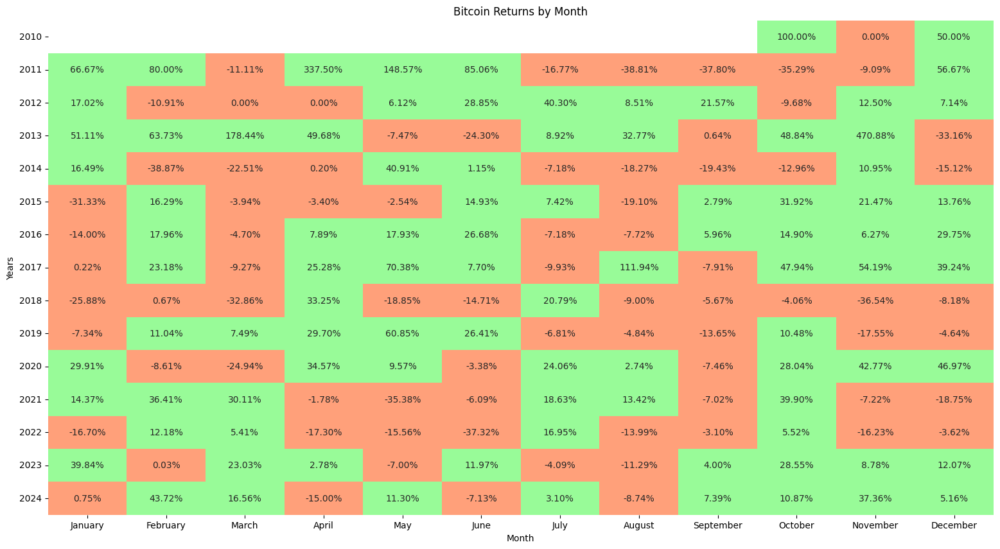

In [6]:
import seaborn as sns
from matplotlib.dates import MonthLocator, DateFormatter
from matplotlib import colors


df["month"] = df["date"].dt.strftime('%Y-%m')

# Compute the monthly returns
df_monthly = df.groupby("month")["price"].last().pct_change()

# Convert the resulting Series to a DataFrame
df_returns = df_monthly.to_frame(name="returns")

# Use pivot_table to reshape the data by year and month
df_pivot = df_returns.pivot_table(index=df_returns.index.str.slice(0,4),
                                  columns=df_returns.index.str.slice(5,),
                                  values="returns")

# import pandas as pd
df_pivot.rename(columns={'01': 'January', 
                          '02': 'February', 
                          '03': 'March', 
                          '04': 'April', 
                          '05': 'May', 
                          '06': 'June', 
                          '07': 'July', 
                          '08': 'August', 
                          '09': 'September', 
                          '10': 'October', 
                          '11': 'November', 
                          '12': 'December'}, inplace=True)
# Create a heatmap using Seaborn

lighter_red = '#FFA07A'
lighter_green = '#98FB98'

heatmap = sns.heatmap(df_pivot, cmap=[lighter_red, lighter_green], cbar=False, annot=True, fmt=".2%", center=0)
heatmap.tick_params(axis='x', rotation=0)

# Get the current tick locations and labels of the x-axis
x_ticks = heatmap.get_xticks()

# Create a list of all the unique x values in the pivot table
x_values = df_pivot.columns.get_level_values(0)

# Set the label for the x-axis of the heatmap
heatmap.set_xlabel('Month')
heatmap.set_ylabel('Years')

# change the figure size
fig = heatmap.get_figure()
fig.set_size_inches(19,10) # adjust the width and height as per your preference
# Set the tick labels for the x-axis
heatmap.set_xticklabels(x_values)

# Add a title to the heatmap
heatmap.set_title("Bitcoin Returns by Month")
# Show the plot
heatmap.figure.savefig("static/heatmap.png")
plt.show()


In [7]:
import plotly.graph_objects as go

# Create figure
fig = go.Figure()

# Define the bins for the gauge chart
bins = [-0.43, -0.18, 0, 0.18, 0.43]
colors = ["red", "orange", "blue", "green"]

# Add trace for the gauge chart with the defined bins
fig.add_trace(go.Indicator(
    mode="gauge+number",
    value=df['move%'].iloc[-1],  # Example current value; set it to your actual value
    title={'text': df['Valuation'].iloc[-1]},
    domain={'x': [0, 1], 'y': [0, 1]},
    gauge={
        'axis': {'range': [min(bins), max(bins)]},
        'bar':{'color':'black'},
        'steps': [{'range': [bins[i], bins[i + 1]], 'color': colors[i]} for i in range(len(bins) - 1)]  # Set to your threshold
    }
))

# Update layout
fig.update_layout(height=400,
                  width=400,
                  title_text="Valuation based on STD Move")

# Display the figure
fig.show()


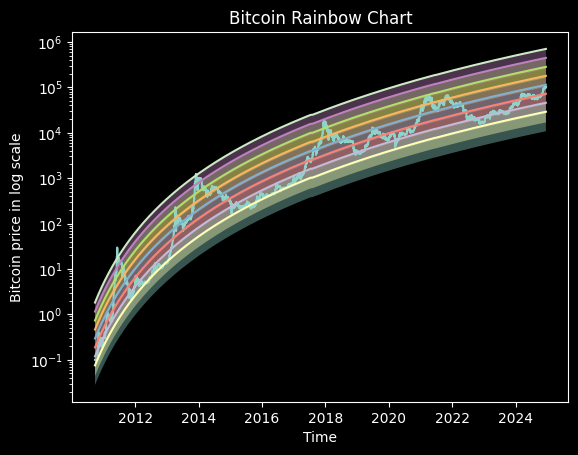

In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit


# This data was gotten on https://data.nasdaq.com/, you need an account to download it, but you have 50 free API calls per day and unlimited if you sign up, which is free.
df =  pd.DataFrame(df).reset_index()

# Rename the 'date' column to 'Date' and the 'price' column to 'Value'
# df = df.rename(columns={'date': 'Date', 'price': 'Value'})

df['date'] = pd.to_datetime(df['date']) # Ensure that the date is in datetime or graphs might look funny
df = df[df["price"] > 0] # Drop all 0 values as they will fuck up the regression bands

# this is your log function
def logFunc(x,a,b,c):
    return a*np.log(b+x) + c

# getting your x and y data from the dataframe
xdata = np.array([x+1 for x in range(len(df))])
ydata = np.log(df["price"])

# here we ar fitting the curve, you can use 2 data points however I wasn't able to get a graph that looked as good with just 2 points.
popt, pcov = curve_fit(logFunc, xdata, ydata, p0 = [10,100,90]) # p0 is justa guess, doesn't matter as far as I know

# This is our fitted data, remember we will need to get the ex of it to graph it
fittedYData = logFunc(xdata, popt[0], popt[1], popt[2])

# Dark background looks nice
plt.style.use("dark_background")
# Plot in a with long Y axis
plt.semilogy(df["date"], df["price"])
plt.title('Bitcoin Rainbow Chart')
plt.xlabel('Time')
plt.ylabel('Bitcoin price in log scale')

# Draw the rainbow bands
for i in range(-2,6):
    df[f"fitted_data{i}"] = np.exp(fittedYData + i*.455)
    plt.plot(df["date"], np.exp(fittedYData + i*.455))
    #You can use the below plot fill between rather than the above line plot, I prefer the line graph
    plt.fill_between(df["date"], np.exp(fittedYData + i*.45 -1), np.exp(fittedYData + i*.45), alpha=0.4)

In [9]:
import plotly.graph_objs as go
import plotly.io as pio

# Set dark background theme
pio.templates.default = "plotly_white"

# Before calling the function or method that triggers the warning:
with warnings.catch_warnings():
    # Ignore FutureWarning raised within this block
    warnings.simplefilter("ignore", FutureWarning)

# Create plot with larger size
    fig = go.Figure()
    fig.update_layout(title='Bitcoin Rainbow Chart', xaxis_title='Time', yaxis_title='Bitcoin price in log scale')

    fig.update_layout(
        autosize=False,
        width=1000,
        height=600)

    fig.update_yaxes(type="log")
    fig.add_trace(
        go.Scatter(x=list(df.date), y=list(df.price), showlegend=False, line_color='black'))
    # Draw the rainbow bands
    for i in range(0, 5):
        fitted_data = np.exp(fittedYData + i * 0.455)
        fig.add_trace(go.Scatter(x=df["date"], y=fitted_data, mode='lines', showlegend=False))

        # You can use the below fill between trace rather than the above line trace, I prefer the line graph
        fig.add_trace(go.Scatter(x=df["date"], y=np.exp(fittedYData + i * .45 - 1), fill=None, mode='lines',
                                line=dict(width=0), showlegend=False))
        fig.add_trace(go.Scatter(x=df["date"], y=np.exp(fittedYData + i * .45), fill='tonexty', mode='lines',
                                name=f"Rainbow Band {i + 1}", line_color=f"hsl({i * 35},90%,50%)", showlegend=False))
        
fig.show()

In [ ]:
# Buy Zones

# Before calling the function or method that triggers the warning:
with warnings.catch_warnings():
    # Ignore FutureWarning raised within this block
    warnings.simplefilter("ignore", FutureWarning)

    fig = px.scatter(df, x="date", y="price", color="Valuation", color_discrete_sequence=["red","green","blue","orange"],
                    title="Price")
    fig.add_trace(go.Scatter(name="MeanAvg", x=df['date'], y=df['meanavge'], marker = {'color' : 'black'}, legendrank=2))
    fig.add_trace(go.Scatter(x=prediction['ds'], y=np.exp(prediction['yhat']),
        fill=None,
        mode='lines',
        line_color='lightblue',
        ))
    fig.add_trace(go.Scatter(
        x=prediction['ds'],
        y=np.exp(prediction['yhat_lower']),
        fill='tonexty', # fill area between trace0 and trace1
        mode='lines', line_color='lightblue'))

    fig.add_trace(go.Scatter(
        x=prediction['ds'],
        y=np.exp(prediction['yhat_upper']),
        fill='tonexty', # fill area between trace0 and trace1
        mode='lines', line_color='lightblue'))

    fig.update_yaxes(fixedrange=False)
    fig.update_layout(title_text='Bitcoin Prophet Model + Buy Zones + Rainbow')
    fig.update_yaxes(type="log")
    fig.update_xaxes(ticklabelposition="inside top", title="Date")
    fig.update_yaxes(nticks=12)
    fig.update_xaxes(nticks=50)
    fig.update_layout(
        margin=dict(l=20, r=100, t=70, b=20),
    )
    fig.update_layout(height=500, width=1000)
    fig.update_layout(showlegend=False)
    fig.add_vline(x='2012-11-28', line_width=3, line_dash="dash", line_color="green")
    fig.add_vline(x='2016-07-09', line_width=3, line_dash="dash", line_color="green")	
    fig.add_vline(x='2020-05-11', line_width=3, line_dash="dash", line_color="green")	
    fig.add_vline(x='2024-04-02', line_width=3, line_dash="dash", line_color="green")

    for i in range(0, 5):
        fitted_data = np.exp(fittedYData + i * 0.455)
        fig.add_trace(go.Scatter(x=df["date"], y=fitted_data, mode='lines', showlegend=False))

        # You can use the below fill between trace rather than the above line trace, I prefer the line graph
        fig.add_trace(go.Scatter(x=df["date"], y=np.exp(fittedYData + i * .45 - 1), fill=None, mode='lines',
                                line=dict(width=0), showlegend=False))
        fig.add_trace(go.Scatter(x=df["date"], y=np.exp(fittedYData + i * .45), fill='tonexty', mode='lines',
                                name=f"Rainbow Band {i + 1}", line_color=f"hsl({i * 35},80%,50%)", showlegend=False))
fig.update_layout(template='plotly_white')
fig.show()

In [13]:
import plotly.express as px
import plotly.graph_objects as go
fig = px.bar(df, x="date", y="price", color="Valuation", color_discrete_sequence=["red","green","blue","orange"],
                 title="price")
fig.add_trace(go.Scatter(name="MeanAvg", x=df['date'], y=df['meanavge'], marker = {'color' : 'black'}, legendrank=2))

fig.update_yaxes(fixedrange=False)
fig.update_layout(title_text='Bitcoin Buy Zones 2.0')
fig.update_yaxes(type="log")
fig.update_xaxes(ticklabelposition="inside top", title="Date")
fig.update_yaxes(nticks=12)
fig.update_xaxes(nticks=50)
fig.update_layout(
    margin=dict(l=20, r=100, t=70, b=20),
)
fig.update_layout(showlegend=True)
fig.update_traces(dict(marker_line_width=.01))
fig.add_vline(x='2012-11-28', line_width=3, line_dash="dash", line_color="green")
fig.add_vline(x='2016-07-09', line_width=3, line_dash="dash", line_color="green")	
fig.add_vline(x='2020-05-11', line_width=3, line_dash="dash", line_color="green")	
fig.add_vline(x='2024-04-02', line_width=3, line_dash="dash", line_color="green")	
fig.layout.template = 'seaborn'
fig.show()

In [14]:

btcfut = yf.Ticker('BTC=F').history(period='9y',interval='1d',actions=False).reset_index()
btcfut['Date'] = btcfut['Date'].apply(lambda x: x.strftime('%Y-%m-%d'))
btcfut = btcfut.rename(columns={"Close": "fut_price", "Date":"date"})
btcfut

c:\Users\chris\anaconda3\envs\python_data\Lib\site-packages\yfinance\utils.py:775: FutureWarning:

The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.



,date,Open,High,Low,fut_price,Volume
0,2017-12-18,20650.0,20650.0,18345.0,19100.0,1054
1,2017-12-19,19135.0,19725.0,17180.0,18200.0,559
2,2017-12-20,17745.0,18350.0,16435.0,17040.0,784
3,2017-12-21,16400.0,17270.0,15080.0,15330.0,879
4,2017-12-22,15595.0,15825.0,12265.0,14135.0,2374
...,...,...,...,...,...,...
1736,2024-11-11,81210.0,89140.0,80670.0,87735.0,22345
1737,2024-11-12,88735.0,90725.0,85890.0,90090.0,21811
1738,2024-11-13,89320.0,94065.0,86925.0,90255.0,20471
1739,2024-11-14,89990.0,92335.0,87345.0,87920.0,12045


In [15]:
btcfut['date'] = pd.to_datetime(btcfut['date'])
df['date'] = pd.to_datetime(df['date'])

merged_df = pd.merge(btcfut, df, on="date", how="inner")
merged_df['price_difference'] = merged_df['fut_price'] - merged_df['price']
merged_df['price_difference_5day'] = merged_df['price_difference'].rolling(window=5).mean()
merged_df['Fut_Position_5day'] = merged_df['price_difference_5day'].apply(lambda x: 'contango' if x > 0 else 'backwardation')
merged_df[['date', 'fut_price', 'price','price_difference','price_difference_5day','Fut_Position_5day']].tail(20)

,date,fut_price,price,price_difference,price_difference_5day,Fut_Position_5day
1716,2024-10-21,67790.000000,67367.851562,422.148438,156.939063,contango
1717,2024-10-22,67490.000000,67361.406250,128.593750,146.879687,contango
1718,2024-10-23,66360.000000,66432.195312,-72.195312,69.984375,contango
1719,2024-10-24,68215.000000,68161.054688,53.945312,179.740625,contango
1720,2024-10-25,68430.507812,66642.414062,1788.093750,464.117188,contango
1721,2024-10-28,70300.000000,69907.757812,392.242188,458.135938,contango
1722,2024-10-29,73340.000000,72720.492188,619.507812,556.318750,contango
1723,2024-10-30,72535.000000,72339.539062,195.460938,609.850000,contango
1724,2024-10-31,70465.000000,70215.187500,249.812500,649.023438,contango
1725,2024-11-01,69730.000000,69482.468750,247.531250,340.910937,contango


In [16]:
import plotly.graph_objs as go
from plotly.offline import iplot

# Assuming your merged DataFrame is named merged_df and has columns 'date', 'fut_price', 'price'

trace1 = go.Scatter(
    x=merged_df['date'],
    y=merged_df['fut_price'],
    mode='lines',
    name='Futures Price'
)

trace2 = go.Scatter(
    x=merged_df['date'],
    y=merged_df['price'],
    mode='lines',
    name='Price'
)

data = [trace1, trace2]

layout = go.Layout(
    title='Price Comparison Over Time',
    xaxis=dict(title='Date'),
    yaxis=dict(title='Price')
)

fig = go.Figure(data=data, layout=layout)
iplot(fig)


In [17]:
import plotly.graph_objs as go
from plotly.offline import iplot

# Define a list of colors based on the value of price_difference
bar_colors = ['green' if val >= 0 else 'red' for val in merged_df['price_difference']]

# Create a bar trace with the colors defined above for price difference
bar_trace = go.Bar(
    x=merged_df['date'],
    y=merged_df['price_difference'],
    marker=dict(color=bar_colors),
    name='Price Difference',
    opacity=0.6
)

# Create a line trace for the Bitcoin price using a secondary y-axis
line_trace = go.Scatter(
    x=merged_df['date'],
    y=merged_df['price'],
    mode='lines',
    name='Bitcoin Price',
    line=dict(color='blue'),  # You can choose any color that suits your needs
    yaxis='y2'
)

line_trace2 = go.Scatter(
    x=merged_df['date'],
    y=merged_df['fut_price'],
    mode='lines',
    name='Bitcoin Futures Price',
    line=dict(color='red'),  # You can choose any color that suits your needs
    yaxis='y2'
)

# Combine both traces
data = [bar_trace, line_trace,line_trace2]

# Define the layout for the combined chart
layout = go.Layout(
    title='Price Difference and Bitcoin Price Over Time',
    xaxis=dict(title='Date'),
    yaxis=dict(title='Price Difference', side='left'),
    yaxis2=dict(
        title='Bitcoin Price',
        side='right',
        overlaying='y',
        range=[min(merged_df['price']), max(merged_df['price'])]  # Optional: set the range
    ),
    showlegend=True,
    legend=dict(x=0.1, y=1.1)
)

# Create a Figure object
fig = go.Figure(data=data, layout=layout)

# Display the figure
iplot(fig)



In [18]:
# Assuming merged_df is already defined and contains the 'price_difference' column.

# # Create the 'Fut_Position' column with 'contango' or 'backwardation'
# merged_df['Fut_Position_5day'] = merged_df['price_difference_5day'].apply(lambda x: 'contango' if x > 0 else 'backwardation')

# Before calling the function or method that triggers the warning:
with warnings.catch_warnings():
    # Ignore FutureWarning raised within this block
    warnings.simplefilter("ignore", FutureWarning)

    fig = px.scatter(merged_df, x="date", y="price", color="Fut_Position_5day", color_discrete_sequence=["red","green"],
                    title="Price")
    

    fig.update_yaxes(fixedrange=False)
    fig.update_layout(title_text='Bitcoin Price Futures Position')
    fig.update_yaxes(type="log")
    fig.update_xaxes(ticklabelposition="inside top", title="Date")
    fig.update_yaxes(nticks=12)
    fig.update_xaxes(nticks=50)
    fig.update_layout(
        margin=dict(l=20, r=100, t=70, b=20),
    )
    fig.update_layout(height=500, width=1000)
    fig.update_layout(showlegend=False)
    fig.add_vline(x='2012-11-28', line_width=3, line_dash="dash", line_color="green")
    fig.add_vline(x='2016-07-09', line_width=3, line_dash="dash", line_color="green")	
    fig.add_vline(x='2020-05-11', line_width=3, line_dash="dash", line_color="green")	
    fig.add_vline(x='2024-04-02', line_width=3, line_dash="dash", line_color="green")

fig.update_layout(template='plotly_white')
fig.show()


In [19]:
import numpy as np
import numpy as np

new_df = df[['index', 'date', 'price']].copy()
new_df['base_10_time'] = np.log10(new_df['index'])
new_df['base_10_price'] = np.log10(new_df['price'])
correlation_coefficient = np.corrcoef(new_df['base_10_time'][2:], new_df['base_10_price'][2:])[0, 1]
print(correlation_coefficient)

import numpy as np

# Get the data
x = new_df['base_10_time'][2:]
y = new_df['base_10_price'][2:]

# Calculate the coefficients of the linear regression equation (degree = 1)
slope, intercept = np.polyfit(x, y, 1)

print(f"The regression equation is y = {slope} * x + {intercept}")



0.9432274737717977
The regression equation is y = 3.135264902580013 * x + -7.168051302043212


c:\Users\chris\anaconda3\envs\python_data\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning:

divide by zero encountered in log10



y = 3.4688980229754556 * t + -8.291963743004583
0.9582981970920479


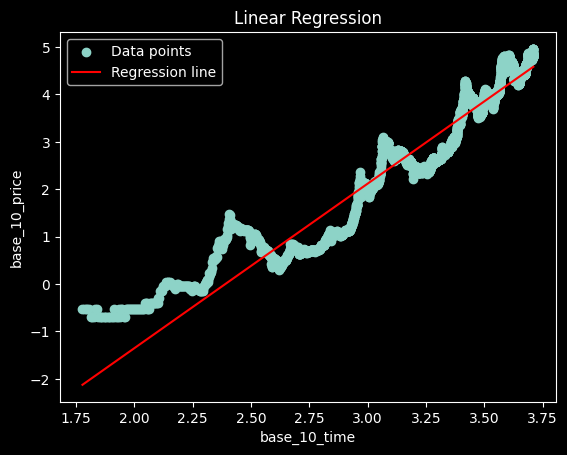

In [20]:
import numpy as np
x = new_df['base_10_time'][60:]
y = new_df['base_10_price'][60:]

# Create a scatter trace for the regression line
slope, intercept = np.polyfit(x, y, 1)

# Create a range of x values for the regression line
x_line = np.linspace(min(x), max(x), 100)

# Calculate the corresponding y values for the regression line
y_line = slope * x_line + intercept

correlation_coefficient = np.corrcoef(x, y)[0, 1]
print(f"y = {slope} * t + {intercept}")

print(correlation_coefficient)


# Plot the data points
plt.scatter(x, y, label='Data points')

# Plot the regression line
plt.plot(x_line, y_line, color='red', label='Regression line')

# Add labels and title
plt.xlabel('base_10_time')
plt.ylabel('base_10_price')
plt.title('Linear Regression')
plt.legend()
# plt.xscale("log")
# Show the plot
plt.show()

y = 3.4688980229754556 * t + -8.291963743004583
0.9582981970920479


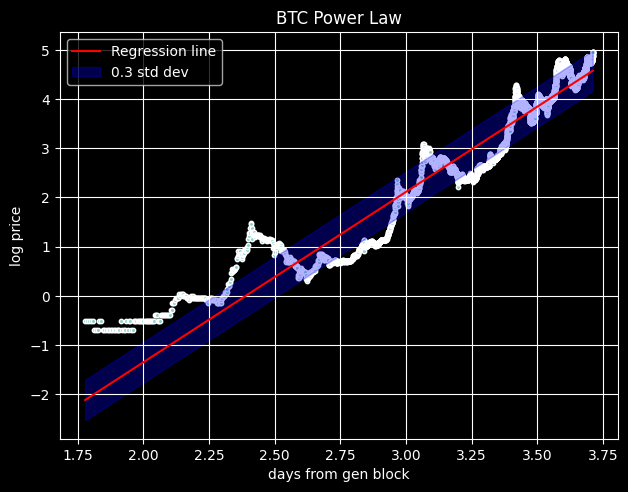

In [21]:
import numpy as np
import matplotlib.pyplot as plt


x = new_df['base_10_time'][60:]
y = new_df['base_10_price'][60:]

# Create a scatter trace for the regression line
slope, intercept = np.polyfit(x, y, 1)

# Create a range of x values for the regression line
x_line = np.linspace(min(x), max(x), 100)

# Calculate the corresponding y values for the regression line
y_line = slope * x_line + intercept

# Calculate the standard deviation of y values
std_dev = np.std(y)

# Calculate the upper and lower bands (0.3 standard deviations away from the line)
y_line_upper = y_line + 0.3 * std_dev
y_line_lower = y_line - 0.3 * std_dev

correlation_coefficient = np.corrcoef(x, y)[0, 1]
print(f"y = {slope} * t + {intercept}")

print(correlation_coefficient)

fig, ax1 = plt.subplots()

# Plot the data points, regression line, and standard deviation bands on the first Axes
ax1.scatter(x, y, s=10, alpha=1, edgecolors="white")
ax1.plot(x_line, y_line, color='red', label='Regression line')
ax1.fill_between(x_line, y_line_lower, y_line_upper, color='blue', alpha=0.3, label='0.3 std dev')
ax1.set_xlabel('days from gen block')
ax1.set_ylabel('log price')
ax1.legend()
ax1.grid(True)
# ax1.set_xscale("log");
fig.tight_layout()


plt.title('BTC Power Law')
plt.show()
new_df.to_csv('Resources/power.csv', index=False)

In [22]:
import numpy as np
import plotly.graph_objects as go

x = new_df['base_10_time'][60:]
y = new_df['base_10_price'][60:]

# Calculate the regression line
slope, intercept = np.polyfit(x, y, 1)
x_line = np.linspace(min(x), max(x), 100)
y_line = slope * x_line + intercept

# Calculate the upper and lower bands
std_dev = np.std(y)
y_line_upper = y_line + 0.5 * std_dev
y_line_lower = y_line - 0.5 * std_dev

# Create the scatter trace
scatter_trace = go.Scatter(
    x=x,
    y=y,
    mode='lines',
    name='BTC Price'
)

regression_trace = go.Scatter(
    x=x_line,
    y=y_line,
    mode='lines',
    name='Regression line',
    line=dict(color='red')
)

# Create traces for the upper and lower bands with fill
y_line_upper_trace = go.Scatter(
    x=x_line,
    y=y_line_upper,
    mode='lines',
    name='0.3 std dev (Upper)',
    line=dict(color='lightblue'),
    fill=None
)

y_line_lower_trace = go.Scatter(
    x=x_line,
    y=y_line_lower,
    mode='lines',
    name='0.3 std dev (Lower)',
    line=dict(color='lightblue'),
    fill='tonexty'
)

# Create the layout
layout = go.Layout(
    title='BTC Power Law',
    xaxis=dict(title='days from gen block',type='log', 
        tickformat=",d", showgrid=True),
    yaxis=dict(title='log price', showgrid=True),
    legend=dict(font=dict(size=12)),
    margin=dict(b=60, l=60, r=40, t=80),
    hovermode='closest',
    font=dict(color='black', family='Arial', size=14)
)

# Create the figure and add the traces
fig = go.Figure(data=[scatter_trace, regression_trace, y_line_upper_trace, y_line_lower_trace], layout=layout)

# Set the x and y axis limits
fig.update_xaxes(range=[0, 7000])
fig.update_yaxes(range=[0, 8])
# Create the layout
layout = go.Layout(
    title='BTC Power Law',
    xaxis=dict(title='days from gen block', showgrid=True),
    yaxis=dict(title='log price', showgrid=True),
    legend=dict(font=dict(size=12)),
    margin=dict(b=60, l=60, r=40, t=80),
    hovermode='closest',
    font=dict(color='black', family='Arial', size=14),
    annotations=[
        dict(
            x=0.05,
            y=0.95,
            xref='paper',
            yref='paper',
            text=f'Correlation Coefficient: {correlation_coefficient:.5f}',
            showarrow=False,
            font=dict(size=12)
        ),
        dict(
            x=0.05,
            y=0.9,
            xref='paper',
            yref='paper',
            text=f'Regression Equation: y = {slope:.10f}x + {intercept:.10f}',
            showarrow=False,
            font=dict(size=12)
        )
    ]
)




# Create the figure and add the traces
fig = go.Figure(data=[scatter_trace, regression_trace, y_line_upper_trace, y_line_lower_trace], layout=layout)

# Set the x and y axis limits

# fig.update_xaxes(type="log") # log range: 10^0=1, 10^5=100000
fig.update_layout(
    autosize=False,
    width=1000,
    height=600)

fig.show()

In [23]:
import numpy as np
import plotly.graph_objects as go

x = new_df['base_10_time'][50:]
y = new_df['base_10_price'][50:]

# Calculate the regression line
slope, intercept = np.polyfit(x, y, 1)
x_line = np.linspace(min(x), max(x), 100)
y_line = slope * x_line + intercept

# Calculate the upper and lower bands
std_dev = np.std(y)
y_line_upper = y_line + .4 * std_dev
y_line_lower = y_line - .4 * std_dev

# Create the scatter trace
scatter_trace = go.Scatter(
    x=x,
    y=y,
    mode='lines',
    name='BTC Price'
)

regression_trace = go.Scatter(
    x=x_line,
    y=y_line,
    mode='lines',
    name='Regression line',
    line=dict(color='red')
)

# Create traces for the upper and lower bands with fill
y_line_upper_trace = go.Scatter(
    x=x_line,
    y=y_line_upper,
    mode='lines',
    name='0.4 std dev (Upper)',
    line=dict(color='lightblue'),
    fill=None
)

y_line_lower_trace = go.Scatter(
    x=x_line,
    y=y_line_lower,
    mode='lines',
    name='0.4 std dev (Lower)',
    line=dict(color='lightblue'),
    fill='tonexty'
)

# Create the figure and add the traces
fig = go.Figure(data=[scatter_trace, regression_trace, y_line_upper_trace, y_line_lower_trace], layout=layout)

# Set the x and y axis limits
fig.update_xaxes(range=[0, 7000])
fig.update_yaxes(range=[0, 8])
# Create the layout
layout = go.Layout(
    title='BTC Power Law',
    xaxis=dict(title='days from gen block', showgrid=True),
    yaxis=dict(title='log price', showgrid=True),
    legend=dict(font=dict(size=12)),
    margin=dict(b=60, l=60, r=40, t=20),
    hovermode='closest',
    font=dict(color='black', family='Arial', size=14),
    annotations=[
        dict(
            x=0.05,
            y=0.95,
            xref='paper',
            yref='paper',
            text=f'Correlation Coefficient: {correlation_coefficient:.5f}',
            showarrow=False,
            font=dict(size=12)
        ),
        dict(
            x=0.05,
            y=0.9,
            xref='paper',
            yref='paper',
            text=f'Regression Equation: y = {slope:.10f}x + {intercept:.10f}',
            showarrow=False,
            font=dict(size=12)
        )
    ]
)



# Create the figure and add the traces
fig = go.Figure(data=[scatter_trace, regression_trace, y_line_upper_trace, y_line_lower_trace], layout=layout)

# Set the x and y axis limits

# fig.update_xaxes(type="log") # log range: 10^0=1, 10^5=100000
fig.update_layout(
    autosize=False,
    width=1000,
    height=600)

# Set the x and y axis limits
fig.update_xaxes(range=[0, 5])  # Adjust the range to include 10
fig.update_yaxes(range=[0, 8])

# Create the second y axis data
y2 = (new_df['price'][10:])
x2 = (new_df['date'][10:])
scatter_trace2 = go.Scatter(
    x=x2,
    y=y2,
    mode='lines',
    name='Price',
    yaxis='y2',
    xaxis='x2',  # Use 'x2' for the second x-axis
    line=dict(color='rgba(255, 255, 255, 0.1)'),  # Change the line color to a lighter shade
    visible=True
)

fig.add_trace(scatter_trace2)

# Update the layout to include the second y axis and the second x axis
fig.update_layout(
    yaxis2=dict(
        title='',
        type='log',  # Set the scale of the y-axis to 'log'
        titlefont=dict(color='blue'),
        tickfont=dict(color='blue'),
        overlaying='y',
        side='right',
    ),
    xaxis2=dict(
        title='Date',
        overlaying='x',
        side='top',
    ),
)




fig.show()


In [24]:
import pandas as pd

# Assuming you have a dataframe 'df' with a 'price' column containing Bitcoin prices
# and a 'moving_average' column containing the 200-day moving average

# Calculate the Mayer Multiple
df['mayer_multiple'] = df['price'] / df['200D']

import plotly.graph_objects as go

fig = go.Figure(data=go.Scatter(x=df['date'], y=df['mayer_multiple'], mode='lines'))
fig.update_layout(title='Mayer Multiple',
                  xaxis_title='Date',
                  yaxis_title='Mayer Multiple')

fig.show()


In [25]:
# Calculate the Mayer Multiple
df['mayer_multiple'] = df['price'] / df['200D']
fig = make_subplots(rows=1, cols=1, shared_xaxes=True)



fig.add_trace(
    go.Scatter(name="Price", x=df['date'], y=df['price'],
               marker=dict(color='orange'),
               mode='markers'),
    row=1, col=1)

# Add Mayer Multiple trace
fig.add_trace(
    go.Scatter(name="Mayer Multiple", x=df['date'], y=df['mayer_multiple'],
               marker=dict(color=df['mayer_multiple'], coloraxis="coloraxis1")),
    row=1, col=1)
fig.add_hline(y='2.4', line_width=3, line_dash="dash", line_color="green")
fig.update_yaxes(type="log", nticks=10)
fig.update_xaxes(nticks=50)
fig.update_layout(coloraxis1=dict(colorscale='Bluered_r'), showlegend=True)
fig.update_layout(coloraxis1_showscale=False)
fig.update_layout(height=700, width=1100, title_text="Price and Mayer Multiple")
fig.update_layout(template='seaborn')

To set the x-axis to a logarithmic scale, you can use the `type` attribute in the `xaxis` dictionary and set it to `'log'`. Here's how you can modify your code:



In [26]:
# First Halving: November 28, 2012
# Second Halving: July 9, 2016
# Third Halving: May 11, 2020


fig = make_subplots()

fig.add_trace(
    go.Scatter(name="Price",x=df['date'], y=df['price'],
        marker=dict(color=df['macd'], coloraxis="coloraxis1")),
    row=1, col=1)

fig.add_vline(x='2012-11-28', line_width=2, line_dash="dash", line_color="red")
fig.add_vline(x='2016-07-9', line_width=2, line_dash="dash", line_color="red")
fig.add_vline(x='2020-05-11', line_width=2, line_dash="dash", line_color="red")
fig.add_vline(x='2024-04-20', line_width=2, line_dash="dash", line_color="red")

fig.update_yaxes(nticks=10)
fig.update_xaxes(nticks=50)
fig.update_yaxes(type="log", row=1, col=1)
fig.update_layout(coloraxis1=dict(colorscale='Bluered_r'), showlegend=True)
fig.update_layout(coloraxis2=dict(colorscale='Bluered_r'), showlegend=True)
fig.update_layout(coloraxis3=dict(colorscale='Bluered_r'), showlegend=True)
fig.update_layout(coloraxis1_showscale=False)
fig.update_layout(coloraxis2_showscale=False)
fig.update_layout(height=700, width=1000, title_text="Cylce Peaks")
fig.update_layout(template='plotly_dark')
fig.show()





In [27]:
import pandas as pd

start_date1 = pd.to_datetime('2010-09-01')
end_date1 = pd.to_datetime('2012-11-28')

First_Cycle = df[df['date'].between(start_date1, end_date1)]
First_Cycle = First_Cycle.loc[:, ['date', 'price']]
First_Cycle['Cumulative Increase'] = (First_Cycle['price'].pct_change() + 1).cumprod() - 1
First_Cycle_max_value = First_Cycle['Cumulative Increase'].max()
print(First_Cycle_max_value)
First_Cycle


295.00000000000057


,date,price,Cumulative Increase
0,2010-09-25,0.1,NaN
1,2010-09-26,0.1,0.0
2,2010-09-27,0.1,0.0
3,2010-09-28,0.1,0.0
4,2010-09-29,0.1,0.0
...,...,...,...
791,2012-11-24,12.4,123.0
792,2012-11-25,12.5,124.0
793,2012-11-26,12.3,122.0
794,2012-11-27,12.2,121.0


In [28]:
start_date2 = pd.to_datetime('2012-11-28')
end_date2 = pd.to_datetime('2016-07-09')

Second_Cycle = df[df['date'].between(start_date2, end_date2)]
Second_Cycle = Second_Cycle.loc[:, ['date', 'price']]
Second_Cycle = Second_Cycle.reset_index(drop=True)
Second_Cycle['Cumulative Increase'] = (Second_Cycle['price'].pct_change() + 1).cumprod() - 1
Second_Cycle_max_value = Second_Cycle['Cumulative Increase'].max()
print(Second_Cycle_max_value)

Second_Cycle

98.80645161290333


,date,price,Cumulative Increase
0,2012-11-28,12.4,NaN
1,2012-11-29,12.4,0.000000
2,2012-11-30,12.6,0.016129
3,2012-12-01,12.6,0.016129
4,2012-12-02,12.5,0.008065
...,...,...,...
1315,2016-07-05,663.7,52.524194
1316,2016-07-06,672.7,53.250000
1317,2016-07-07,635.3,50.233871
1318,2016-07-08,662.8,52.451613


In [29]:
start_date3 = pd.to_datetime('2016-07-10')
end_date3 = pd.to_datetime('2020-05-11')

Third_Cycle = df[df['date'].between(start_date3, end_date3)]
Third_Cycle = Third_Cycle.loc[:, ['date', 'price']]
Third_Cycle = Third_Cycle.reset_index(drop=True)
Third_Cycle['Cumulative Increase'] = (Third_Cycle['price'].pct_change() + 1).cumprod() - 1
Third_Cycle_max_value = Third_Cycle['Cumulative Increase'].max()
print(Third_Cycle_max_value)
Third_Cycle

28.895688456189152


,date,price,Cumulative Increase
0,2016-07-10,647.1,NaN
1,2016-07-11,646.7,-0.000618
2,2016-07-12,670.6,0.036316
3,2016-07-13,661.2,0.021790
4,2016-07-14,657.3,0.015763
...,...,...,...
1376,2020-05-07,9979.8,14.422346
1377,2020-05-08,9806.2,14.154072
1378,2020-05-09,9554.6,13.765260
1379,2020-05-10,8738.8,12.504559


In [30]:
start_date3 = pd.to_datetime('2016-07-10')
end_date3 = pd.to_datetime('2020-05-11')

Third_Cycle = df[df['date'].between(start_date3, end_date3)]
Third_Cycle = Third_Cycle.loc[:, ['date', 'price']]
Third_Cycle = Third_Cycle.reset_index(drop=True)
Third_Cycle['Cumulative Increase'] = (Third_Cycle['price'].pct_change() + 1).cumprod() - 1
Third_Cycle_max_value = Third_Cycle['Cumulative Increase'].max()
print(Third_Cycle_max_value)
Third_Cycle.head(5)

28.895688456189152


,date,price,Cumulative Increase
0,2016-07-10,647.1,NaN
1,2016-07-11,646.7,-0.000618
2,2016-07-12,670.6,0.036316
3,2016-07-13,661.2,0.021790
4,2016-07-14,657.3,0.015763


In [31]:
start_date4 = pd.to_datetime('2020-05-11')
end_date4 = pd.to_datetime('2024-03-24')

Fourth_Cycle = df[df['date'].between(start_date4, end_date4)]
Fourth_Cycle = Fourth_Cycle.loc[:, ['date', 'price']]
Fourth_Cycle = Fourth_Cycle.reset_index(drop=True)
Fourth_Cycle['Cumulative Increase'] = (Fourth_Cycle['price'].pct_change() + 1).cumprod() - 1
Fourth_Cycle_max_value = Fourth_Cycle['Cumulative Increase'].max()
print(Fourth_Cycle_max_value)
Fourth_Cycle.head(5)

7.518088999743576


,date,price,Cumulative Increase
0,2020-05-11,8579.8,NaN
1,2020-05-12,8813.8,0.027273
2,2020-05-13,9298.7,0.083790
3,2020-05-14,9778.4,0.139700
4,2020-05-15,9318.0,0.086039


In [32]:
from prophet import Prophet
import plotly.graph_objects as go

x = ['First Cycle', 'Second Cycle', 'Third Cycle', 'Fourth Cycle']
y_max_value = [First_Cycle_max_value, Second_Cycle_max_value, Third_Cycle_max_value, Fourth_Cycle_max_value]
y_cumulative_increase = [First_Cycle['Cumulative Increase'].iloc[-1], Second_Cycle['Cumulative Increase'].iloc[-1], Third_Cycle['Cumulative Increase'].iloc[-1], Fourth_Cycle['Cumulative Increase'].iloc[-1]]
# Create the grouped bar chart
fig = go.Figure(data=[
    go.Bar(name='Max Value', x=x, y=y_max_value),
    go.Bar(name='Cumulative Increase', x=x, y=y_cumulative_increase)
])

# Update the layout of the chart
fig.update_layout(
    title='Max Value and Cumulative Increase by Cycle',
    xaxis_title='Cycle',
    yaxis_title='Value',
    barmode='group'
)

# Show the chart
fig.show()

# Prepare the data for Prophet
fifth_cycle_data = Fourth_Cycle[['date', 'price', 'Cumulative Increase']].copy()
fifth_cycle_data.columns = ['ds', 'y', 'cumulative_increase']





In [33]:
import pandas as pd
data = {
    'Cycle': ['First Cycle', 'Second Cycle', 'Third Cycle', 'Fourth Cycle'],
    'Max Value': [First_Cycle_max_value, Second_Cycle_max_value, Third_Cycle_max_value, Fourth_Cycle_max_value],
    'Max Value Date': [First_Cycle['date'][First_Cycle['Cumulative Increase'].idxmax()], Second_Cycle['date'][Second_Cycle['Cumulative Increase'].idxmax()], Third_Cycle['date'][Third_Cycle['Cumulative Increase'].idxmax()], Fourth_Cycle['date'][Fourth_Cycle['Cumulative Increase'].idxmax()]],
    'Max Value Price': [First_Cycle['price'][First_Cycle['Cumulative Increase'].idxmax()], Second_Cycle['price'][Second_Cycle['Cumulative Increase'].idxmax()], Third_Cycle['price'][Third_Cycle['Cumulative Increase'].idxmax()], Fourth_Cycle['price'][Fourth_Cycle['Cumulative Increase'].idxmax()]],
    'Cumulative Increase': [First_Cycle['Cumulative Increase'].iloc[-1], Second_Cycle['Cumulative Increase'].iloc[-1], Third_Cycle['Cumulative Increase'].iloc[-1], Fourth_Cycle['Cumulative Increase'].iloc[-1]],
    'Cumulative Increase Date': [First_Cycle['date'].iloc[-1], Second_Cycle['date'].iloc[-1], Third_Cycle['date'].iloc[-1], Fourth_Cycle['date'].iloc[-1]],
    'Cumulative Increase Price': [First_Cycle['price'].iloc[-1], Second_Cycle['price'].iloc[-1], Third_Cycle['price'].iloc[-1], Fourth_Cycle['price'].iloc[-1]],
    'Start Date': [First_Cycle['date'].iloc[0], Second_Cycle['date'].iloc[0], Third_Cycle['date'].iloc[0], Fourth_Cycle['date'].iloc[0]],
    'Start Price': [First_Cycle['price'].iloc[0], Second_Cycle['price'].iloc[0], Third_Cycle['price'].iloc[0], Fourth_Cycle['price'].iloc[0]]
}

# Create a dataframe from the dictionary
df_max_cumulative = pd.DataFrame(data)

# Print the dataframe
df_max_cumulative


,Cycle,Max Value,Max Value Date,Max Value Price,Cumulative Increase,Cumulative Increase Date,Cumulative Increase Price,Start Date,Start Price
0,First Cycle,295.000000,2011-06-08,29.6,123.000000,2012-11-28,12.400000,2010-09-25,0.1
1,Second Cycle,98.806452,2013-12-04,1237.6,51.564516,2016-07-09,651.800000,2012-11-28,12.4
2,Third Cycle,28.895688,2017-12-16,19345.5,12.258847,2020-05-11,8579.800000,2016-07-10,647.1
3,Fourth Cycle,7.518089,2024-03-13,73083.5,6.836333,2024-03-24,67234.171875,2020-05-11,8579.8


In [34]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import datetime
fig = make_subplots()

fig.add_trace(
    go.Scatter(name="Price", x=df['date'], y=df['price'],
               marker=dict(color=df['macd'], coloraxis="coloraxis1")),
    row=1, col=1
)

fig.update_layout(showlegend=False)


fig.add_vline(x='2012-11-28', line_width=2, line_dash="dash", line_color="red")
fig.add_vline(x='2016-07-9', line_width=2, line_dash="dash", line_color="red")
fig.add_vline(x='2020-05-11', line_width=2, line_dash="dash", line_color="red")
fig.add_vline(x='2024-04-20', line_width=2, line_dash="dash", line_color="red")
fig.update_yaxes(nticks=10)

for i in range(len(df_max_cumulative)):
    start_date = df_max_cumulative['Start Date'][i]
    start_price = df_max_cumulative['Start Price'][i]
    max_value_date = df_max_cumulative['Max Value Date'][i]
    max_value_price = df_max_cumulative['Max Value Price'][i]
    cumulative_increase_date = df_max_cumulative['Cumulative Increase Date'][i]
    cumulative_increase_price = df_max_cumulative['Cumulative Increase Price'][i]

    fig.add_trace(go.Scatter(
        x=[start_date, max_value_date, cumulative_increase_date],
        y=[start_price, max_value_price, cumulative_increase_price],
        mode='markers',
        marker=dict(
            size=10,
            color=['red', 'blue', 'green'], # set color of each dot
        )
    ))
    
    # Add lines connecting the dots
    fig.add_shape(
        type="line",
        x0=start_date,
        y0=start_price,
        x1=max_value_date,
        y1=max_value_price,
        line=dict(
            color="Orange",
            width=4,
        ),
    )
    fig.add_shape(
        type="line",
        x0=max_value_date,
        y0=max_value_price,
        x1=cumulative_increase_date,
        y1=cumulative_increase_price,
        line=dict(
            color="Orange",
            width=4,
        ),
    )
    
    fig.add_shape(
    type="line",
    x0=start_date,
    y0=start_price,
    x1=cumulative_increase_date,
    y1=cumulative_increase_price,
    line=dict(
        color="Green",
        width=4,
    ),
)
    

fig.add_trace(go.Scatter(
    x=[datetime.datetime(2021, 11, 8)],
    y=[67527.9],
    mode='markers',
    marker=dict(
        size=10,
        color='blue',
    )
))

start_date = df_max_cumulative['Start Date'][3]
start_price = df_max_cumulative['Start Price'][3]

fig.add_shape(
    type="line",
    x0=datetime.datetime(2021, 11, 8),
    y0=67527.9,
    x1=start_date,
    y1=start_price,
    line=dict(
        color="orange",
        width=4,
    ),
)

cumulative_increase_date = df_max_cumulative['Cumulative Increase Date'][3]
cumulative_increase_price = df_max_cumulative['Cumulative Increase Price'][3]

fig.add_shape(
    type="line",
    x0=datetime.datetime(2021, 11, 8),
    y0=67527.9,
    x1=cumulative_increase_date,
    y1=cumulative_increase_price,
    line=dict(
        color="orange",
        width=4,
    ),
)

fig.update_yaxes(nticks=10)
fig.update_xaxes(nticks=50)
fig.update_yaxes(type="log")
fig.update_layout(height=700, width=1000, title_text="Price Geometry")
fig.update_layout(template='plotly_dark')
fig.show()


In [35]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import datetime
fig = make_subplots()

# fig.add_trace(
#     go.Scatter(name="Price", x=df['date'], y=df['price'],
#                marker=dict(color=df['macd'], coloraxis="coloraxis1")),
#     row=1, col=1
# )

fig.update_layout(showlegend=False)


fig.add_vline(x='2012-11-28', line_width=2, line_dash="dash", line_color="red")
fig.add_vline(x='2016-07-9', line_width=2, line_dash="dash", line_color="red")
fig.add_vline(x='2020-05-11', line_width=2, line_dash="dash", line_color="red")
fig.add_vline(x='2024-04-20', line_width=2, line_dash="dash", line_color="red")
fig.update_yaxes(nticks=10)

for i in range(len(df_max_cumulative)):
    start_date = df_max_cumulative['Start Date'][i]
    start_price = df_max_cumulative['Start Price'][i]
    max_value_date = df_max_cumulative['Max Value Date'][i]
    max_value_price = df_max_cumulative['Max Value Price'][i]
    cumulative_increase_date = df_max_cumulative['Cumulative Increase Date'][i]
    cumulative_increase_price = df_max_cumulative['Cumulative Increase Price'][i]

    fig.add_trace(go.Scatter(
        x=[start_date, max_value_date, cumulative_increase_date],
        y=[start_price, max_value_price, cumulative_increase_price],
        mode='markers',
        marker=dict(
            size=10,
            color=['red', 'blue', 'green'], # set color of each dot
        )
    ))
    
    # Add lines connecting the dots
    fig.add_shape(
        type="line",
        x0=start_date,
        y0=start_price,
        x1=max_value_date,
        y1=max_value_price,
        line=dict(
            color="Orange",
            width=4,
        ),
    )
    fig.add_shape(
        type="line",
        x0=max_value_date,
        y0=max_value_price,
        x1=cumulative_increase_date,
        y1=cumulative_increase_price,
        line=dict(
            color="Orange",
            width=4,
        ),
    )
    
    fig.add_shape(
    type="line",
    x0=start_date,
    y0=start_price,
    x1=cumulative_increase_date,
    y1=cumulative_increase_price,
    line=dict(
        color="Green",
        width=4,
    ),
)
    

fig.add_trace(go.Scatter(
    x=[datetime.datetime(2021, 11, 8)],
    y=[67527.9],
    mode='markers',
    marker=dict(
        size=10,
        color='blue',
    )
))

start_date = df_max_cumulative['Start Date'][3]
start_price = df_max_cumulative['Start Price'][3]

fig.add_shape(
    type="line",
    x0=datetime.datetime(2021, 11, 8),
    y0=67527.9,
    x1=start_date,
    y1=start_price,
    line=dict(
        color="orange",
        width=4,
    ),
)

cumulative_increase_date = df_max_cumulative['Cumulative Increase Date'][3]
cumulative_increase_price = df_max_cumulative['Cumulative Increase Price'][3]

fig.add_shape(
    type="line",
    x0=datetime.datetime(2021, 11, 8),
    y0=67527.9,
    x1=cumulative_increase_date,
    y1=cumulative_increase_price,
    line=dict(
        color="orange",
        width=4,
    ),
)

fig.update_yaxes(nticks=10)
fig.update_xaxes(nticks=50)
fig.update_yaxes(type="log")
fig.update_layout(height=700, width=1000, title_text="Price Geometry")
fig.update_layout(template='plotly_dark')
fig.show()
